# EE 120 Lab 5: Deconvolution
v1 - Spring 2019: Dominic Carrano, Ilya Chugunov   
v2 - Fall 2019: Dominic Carranov, Ilya Chuguno

In [10]:
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
from scipy import signal, linalg
from scipy.io import wavfile
%matplotlib inline

# Background

The background provided for this lab is long but comprehensive. You should read the [Signal Processing View of Deconvolution](#sp_view_deconv) section before starting. After you've digested that, feel free to start working on the problems and come back to use the rest as a reference as needed.

<a id="sp_view_deconv"></a>
## Signal Processing View of Deconvolution

### Motivation

We have discussed convolution in great detail so far in EE 120, and for a good reason: any LTI system maps an input signal to an output signal through convolution with its impulse response. Many real world systems — whether they be the dynamics of a physical process, electronic components, or even digital filters you implement in Python — are LTI or well-approximated as LTI. This makes convolution the most important operation in signals and systems. For us, it is as fundamental as matrix-vector multiplication is in linear algebra.  

Up to this point, we've generally considered LTI systems as "good". They can do very useful things like filter unwanted frequency content out of signals for us as low and band pass filters do, or help us extract trends in data via moving averages. In this lab, we're going to flip things around. You'll get a chance to look at two examples of "evil" LTI systems, and how to negate their effects by *deconvolving* their impulse responses out of signals:
- **Echo cancellation**. When we transmit a signal indoors, it typically bounces off many surfaces (determined by the room's acoustics) before reaching the intended receiver. How to we discern the original signal given that we have several copies of it of various strengths and delays added together?  
- **Image deblurring.** If a camera's optics haven't been properly polished, it tends to produce pictures that are obscured by a blurring effect. When the Hubble Space Telescope — a $1.5 billion dollar project — was first deployed in 1990, it had exactly this problem. A team of astronauts had to be sent up to fix the defective hardware. How can we digitally deblur the pictures we get in the meantime?

### Problem Formulation

Deconvolution algorithms are typically implemented using software. Accordingly, we'll pose the problem as a discrete time one. However, keep in mind that many of the systems whose impulse response we deconvolve are truly CT. Fortunately, we don't lose any generality in doing so: we can just sample the system's impulse response and then treat it as a DT system.

We assume our measured signal $y[n]$ was produced by an (undesired) convolution of the true signal $x[n]$ with some impulse response $h[n]$, so that $y[n] = (x * h)[n]$. We know $y, h$ and want to recover $x$.

Let's consider the echo example again to make things concrete. Suppose Dominic's sending Ilya a song inside Cory Hall, which has lots of walls that the signal bounces off of during transmission.
- $x$ is the true song Dominic sends, which Ilya's trying to recover. Ilya doesn't have access to $x$.
- $y$ is the corrupted version of $x$, which Ilya receives. It will contain $x$ along with a delayed, weaker (since the signal loses some power as it bounces off the walls) copy of $x$, which is the echo.
- $h$ is the impulse response modelling the echo, which Ilya also knows. Don't worry too much about what $h$ would actually be; we'll discuss it later.

In the next section, we'll discuss how to actually go about recovering $x$ from $y, h$.

## Systems View of Deconvolution

Having considered deconvolution in terms of signals, it's worth considering what's going on from a systems point of view to better understand the problem. It turns out that this perspective will be more useful in coming up with a solution.

### Deconvolution is an Inverse System Design Problem

We have a system $H$ that corrupts our clean signal $x$ to produce $y$. Our goal is to design an *inverse* system $H^{-1}$ that, when given $y$, recovers $x$:

<img src="figs/InverseSystem.png" width="600px"></img>

It's not immediately obvious that $H^{-1}$ exists, is unique, or that it's even an LTI system. Fortunately, the Fourier Transform can help us better understand how to design $H^{-1}$.

<a id="fourier_deconv"></a>

### Fourier Deconvolution

We know that $y[n] = (x*h)[n]$, but given how complicated convolution is in the time domain, it seems like trying to undo it purely in the time-domain would be intractable. Fortunately, things are much simpler in the frequency domain. Using the convolution property of the Fourier Transform, we have that

$$Y(\omega) = X(\omega)H(\omega)$$

where $X, H$ are the DTFTs of the time domain signals $x, h$. We know $y, h$ which means we also know $Y, H$ (just take their DTFTs, or FFTs if you have sampled versions on a computer). Let's rearrange and put all the known terms on the left, which gives

$$\frac{Y(\omega)}{H(\omega)} = X(\omega)$$

Since we know $Y, H$ and don't know $X$, we now have a formula to compute the spectrum of the uncorrupted signal $x$: just divide the measured signal's spectrum, $Y$, by the parasitic system's frequency response, $H$. After doing so, by taking the inverse DTFT (or FFT), we recover the original signal!

Thus, our analytically derived algorithm for deconvolution (given $y,h$) is:
- Compute $Y$ = FFT($y$).   
- Compute $H$ = FFT($h$).  
- Compute $X$ = $\frac{Y}{H}$.  
- Compute $x$ = InverseFFT($X$).  
- Return $x$.

This is known as *Fourier deconvolution*, since we do the deconvolution in the Fourier (frequency) domain via division. Once again, we see why understanding the Fourier Transform and its properties is so useful. 

We can see that $H^{-1}$ is the system whose frequency response is 

$$H^{-1}(\omega) = \dfrac{1}{H(\omega)}$$

and whose impulse response is 

$$h^{-1}[n] = \frac{1}{2\pi}\int_{-\pi}^{\pi} \frac{1}{H(\omega)}e^{j\omega n} d\omega$$

which is an LTI system! Going back to the time-domain, deconvolving $h$ out of $y$ can be thought of as a *convolution* of $y$ with an *inverse* impulse response $h^{-1}$, so that $(h * h^{-1})[n] = \delta[n]$, meaning that the effect of passing $x$ through $H$ and then $H^{-1}$ is nothing - we recover the original signal!

## Issues with Fourier Deconvolution

Contrary to what Smash Mouth might claim, all that glitters is *not* gold. 

### Theoretical Issues

Consider the expression for the inverse system's frequency response:

$$H^{-1}(\omega) = \dfrac{1}{H(\omega)}$$

We've implicitly assumed that $H(\omega)$ is always nonzero, otherwise this expression isn't well-defined. What does it mean for $H^{-1}(\omega)$ to be undefined at a particular frequency, say, $\omega_0$? This means that $H(\omega_0)$ is zero: any content in the input at frequency $\omega_0$ is always wiped out.

Let's consider two input signals, $x_1[n] = e^{j\omega_0 n}$ and $x_2[n] = 0$. We have $y_1[n] = H(\omega_0)e^{j\omega_0 n}$ by the eigenfunction property. Since $H(\omega_0) = 0$, we have $y_1[n] = 0$. We also have $y_2[n] = 0$, since all linear systems produce a zero output for a zero input. So, given only the impulse $h[n]$ (or frequency response $H(\omega)$) and that $y[n] = 0$, we can't tell whether $x_1[n]$ or $x_2[n]$ was the input, so we have no way to invert the system! 

This is exactly the same reasoning you saw in EE 16A for why any invertible matrix must have a trivial nullspace: since $A\vec{0} = \vec{0}$ for any matrix $A$, if there's a different nonzero $\vec{v}$ such that $A\vec{v} = \vec{0}$, there's no way to tell if $\vec{0}$ or $\vec{v}$ was the input that produced the output $\vec{0}$, and so $A$ can't be inverted.

### Practical Issues

#### Divide by Zero Doesn't Really Ever Happen

Practically speaking, $H(\omega)$ will never be *exactly* zero at a given frequency because most real world systems won't completely wipe out information at a frequency they don't like, they'll just severely attenuate it. 

For example, here's a plot of the frequency response of the [LTC1564 anti-aliasing filter](https://www.analog.com/media/en/technical-documentation/data-sheets/1564fa.pdf) from Linear Technology. There are two separate things being plotted; the top line is when the filter's gain is set to 100, and the bottom when the gain is set to 1. Let's consider the unity gain setting.

<img src="figs/filter_response.png" width="300px">

We see that when the gain is 1 ("1V/V" on the data sheet), the cutoff frequency is $10 \text{ kHz}$. Yet, at $100 \text{ kHz}$, which is ten times the cutoff, the filter's gain is $-120 \text{ dB}$, which is $10^{-12}$. It's very small, but not quite zero. This means that if we put in a one Volt AC signal at the frequency $100 \text{ kHz}$, say, $x[n] = \cos(2\pi \cdot 100 n)$, we'll get out $y[n] = 10^{-12} x[n]$. The amplitude of the waveform will go from one Volt to ten *pico* Volts. But, keep in mind that the filter will naturally add in some noise. So, while the frequency response isn't zero, any signal content in that region will be hidden under noise, and so it's effectively useless to try and recover that information, even if we do have a nonzero number to divide by. This sort of "not technically zero, but effectively zero" behavior outside the system bandwidth is typical in practical cases.

#### Noise

As you've seen, we don't really encounter divide by zero errors in real life. So, in real life, is deconvolution easier than the theoretical case? No, not quite. Instead, we have *noise* to contend with. A more realistic model of our parasitic system is $y[n] = (x*h)[n] + z[n]$, where $z$ is some (random) noise signal that additively corrupts the measurement after the convolution. What sort of issue does this cause? Let's consider some frequency $\omega_0$ where $H(\omega_0)$ is small. 

We get

$$Y(\omega_0) = X(\omega_0)H(\omega_0) + Z(\omega_0)$$

so that 

$$\underbrace{\dfrac{Y(\omega_0)}{H(\omega_0)}}_\text{Recovered spectrum at $\omega_0$} = \underbrace{X(\omega_0)}_\text{True spectrum at $\omega_0$} + \underbrace{\dfrac{Z(\omega_0)}{H(\omega_0)}}_\text{Noise term}$$

So we recover the true spectrum $X(\omega_0)$ plus this extra term from the noise. If $H(\omega_0)$ is small, and we divide the noise by it, the noise is greatly amplified by the deconvolution! This is **the** main problem with Fourier deconvolution: the frequencies that were most suppressed by the filter (i.e., the ones we want to restore the most) are the ones where the noise will blow up the worst when we deconvolve!

### It's all about that SNR

Despite Fourier deconvolution's seemingly fatal flaw, it's a reasonably popular algorithm in practice because it's very easy to implement. We'll be using it as our method of choice in 1D and 2D in this lab. In cases where we have a high *Signal-to-Noise Ratio* (SNR), meaning the signal is much stronger than the noise, it works fairly well: $X(\omega_0)$ is large enough to overpower the amplified noise term $Z(\omega_0) / H(\omega_0)$, and we still get a good estimate. We'll explore this in more depth in the latter parts of Q1.

In signal processing, having an estimate of your SNR is a crucial part of system modelling. As we've discussed here, the algorithms that should be used depend on how good or bad the SNR is. And, of course, if the SNR gets bad enough, no algorithm, no matter how clever, will do a good job of extracting meaningful information. Wiener deconvolution, briefly mentioned below, explicitly incorporates information about the SNR (assuming it is known; often it is) and is able to provide a provably optimal (in terms of mean squared error) deconvolution algorithm as a result.

## Other deconvolution algorithms

More sophisticated approaches to deconvolution do exist. Links to supplemental material on them are provided in the References section. Briefly, here are two that show up a lot in practice:
- **Wiener deconvolution.** Wiener deconvolution is Fourier deconvolution with modifications informed by the statistical properties of your signals and noise. Not surprisingly (by nature of using more information), it tends to perform better in practice. It computes $H^{-1}(\omega)$ using $1 / H(\omega)$ as the Fourier approach does. However, it includes a multiplicative factor at each $\omega$ based on how much noise there is there. This essentially tells you how much you can trust the inverse for that particular frequency. From a statistical estimation point of view, the Wiener method is very nice as it minimizes the *Mean Squared Error* (MSE) between your deconvolved estimate and the true signal.
- **Richardson-Lucy deconvolution.** Unlike Fourier and Wiener deconvolution, the Richardson-Lucy approach does deconvolution in the time domain. First, an initial estimate of $x$ is produced. Then, the algorithm refines the estimate by convolving it with $h$ and seeing how far off it is from $y$, repeating this step for some number of iterations.

# Q1: Echo Cancellation

A classic problem in signals and systems, acoustics, and digital communications is *echo cancellation*. A sender transmits a signal to someone, and they receive it, along with a delayed, attenuated copy of it. 

There are many causes of this phenomenon which you can read about in the references, including:
- Signal back reflections due to impedance mismatches in electronic circuits [[1, 2](#References)].
- Audio feedback in microphones [[3](#References)].
- Acoustic properties of the space the signal is being transmitted in. For example, if you send a signal indoors, it may go in multiple directions, with part of the signal going straight to a receiver, and the rest of it bouncing off of several walls before it arrives as a delayed and attenuated copy of the first.

## Modelling an echo

Many different models for echoes have been considered (as well models for reverberation to solve the related, but more complicated problem of *dereverberation* [[4](#References)]), and you can find a more comprehensive treatment of this subject in [[5](#References)]. Here, we'll consider one of the simpler models for an echo, where our communication channel is an LTI system with impulse response

$$h[n] = \delta[n] + \alpha \delta[n - k]$$

where $0 < \alpha < 1$ is the attenuation of the echo and $k > 0$ is the integer delay of the echo. We can think of this as a channel that transmits the signal perfectly and instantaneously, and also with a $k$-step delay and some attenuation along an echo path. In this problem, we'll send some audio over this channel, and try to undo the corruptions it introduces. Since the channel is assumed to be LTI, deconvolution is an appropriate technique to use.

## A Brief Intro to Audio Signals

In this question, we'll use ["Take on Me" by a-ha](https://www.youtube.com/watch?v=djV11Xbc914) as our test signal. We have provided it for you as a [.wav](https://en.wikipedia.org/wiki/WAV) file. We've only provided the first 45 seconds to avoid dealing with copyright issues. Run the cell below and have a listen! It's normal if the cell takes a few seconds to load. You'll see a graphic display pop up with a play button once it's finished loading.

In [2]:
ipd.Audio("wavs/TakeOnMe.wav")

Now, we'll read the file as a numpy array using scipy's WAV file API. The `read` function returns two things: the sampling rate of the audio, and the signal itself.

In [3]:
# In signal processing code, "fs" is conventionally used for sampling frequency in Hertz (cycles/second)
fs, data = wavfile.read("wavs/TakeOnMe.wav")

Typically, digital audio is sampled at 44.1 kHz, or 44100 Hz, although some more modern formats use 48 kHz. This is motivated by the fact that the human ear can only hear up to, at best, around 20 kHz, so the Nyquist criterion suggests that the sampling rate should be at least 40 kHz, with some extra wiggle room added on. We can easily verify that we're dealing with a sampling rate of 44.1 kHz.

In [4]:
print(fs) # sampling rate in Hz

44100


When dealing with real world data, a good first step before processing it is checking what size it is using `np.shape`, just as we did when building our heart rate detector in Lab 4.

In [5]:
np.shape(data)

(1984500, 2)

The song, when read in as a signal, is actually a 1984500-by-2 matrix! But why?

The track's runtime is 45 seconds, and with a sampling rate of 44.1 kHz, we expect a total of 

$$45\ \text{seconds} \cdot \frac{44100\ \text{samples}}{1\ \text{second}} = 1984500\ \text{samples}$$

in our data. That explains the first dimension. Why a two column matrix, though?

The reason we have two separate columns of data, rather than a single array of 1984500 samples, is due to the use of [two-channel audio](https://en.wikipedia.org/wiki/Stereophonic_sound). 

When you listen to music with a pair of headphones, each ear is receiving a separate audio stream, hence the need for two samples at each point in time. The same principle applies to laptops or other sound systems with two speakers. 

**What this means for us is that each channel (i.e., column of this matrix) should be processed as a distinct signal.**

Now that we're acquainted with our signal, let's do some cool stuff with it!

## Q1a: Cropping

Before moving on, we'll crop our signal to the first 10 seconds of data, so that our code doesn't take forever to run. Even with the state of the art in highly optimized signal processing algorithms, numpy's not going to like doing convolution or an FFT on an array with 10 million entries in it.

In the cell below, redefine `data` by only including the first 10 seconds of data. Your code should use `n_sec`, the number of seconds we want to crop, as well as `fs`, the sampling rate, as a generic variable, rather than using 44100 as a [magic number](https://en.wikipedia.org/wiki/Magic_number_&#40;programming&#41;&#35;Unnamed_numerical_constants).

**Hint:** Cropping data (e.g., slicing in Python) from a multidimensional array is just like doing it on a one dimensional array, you just have to specify indices for each axis separated by commas. For example, if `A` were a 2D array, or matrix, `A[0:5, :]` would copy all columns of `A`, but only keep the first 5 rows.

In [6]:
n_sec = 10

In [7]:
# TODO crop data to first n_sec seconds; result should still have two columns
data_cropped = data[0:n_sec*fs,:]

As a sanity check, run the cell below to play the first 10 seconds of the song. The display should show that the file has 10 seconds of audio, and it should sound exactly the same as before.

In [8]:
wavfile.write("wavs/cropped_TakeOnMe.wav", fs, data_cropped)
ipd.Audio("wavs/cropped_TakeOnMe.wav")

In [21]:
a = np.array([1])
b = np.array([[1,2],[3,4]])
b[:,0]

array([1, 3])

If your new song is ten seconds long and sounds otherwise the same, move on to Q1b.

## Q1b: Transmission

Implement the function `transmit` below to simulate the echo channel. As a reminder so you don't have to keep scrolling back and forth, we're modelling the channel as an LTI system with impulse response

$$h[n] = \delta[n] + \alpha \delta[n-k]$$

where $\alpha$ (the attentuation factor) and $k$ (the delay of the echo in samples) are provided to you as function arguments, along with the signal to transmit, $x$. 

Your function should return the result of transmitting $x$ over the channel, performing the parasitic convolution we'll later be trying to undo. Each audio channel should be considered as a separate signal when transmitting.

### Quantization

All audio we're working with is [*quantized*](https://en.wikipedia.org/wiki/Quantization_(signal_processing&#41;) to 16 bits. What this means is that after processing our signal, we have to renormalize each entry to be a 16-bit integer value, or there will be terrible distortions when we try to listen to it. After you transmit the song clip and reassemble it into a the two-channel matrix, say `x_echoed`, apply the following line of code: **`np.int16(x_echoed / np.max(np.abs(x_echoed)) * np.iinfo(np.int16).max)`**. This fits every value to the range [-1, +1] and then rescales it to be within the range of [-32767, 32767]. This will be the last thing you have to do before returning the result.

**Hint:** All convolutions should be done in "full" mode to avoid cutting out data. Since we're using "full", there's no need to pad implicit zeros onto the echo channel impulse response; it should only be length $k+1$.

In [26]:
def transmit(x, alpha, k):
    """
    Simulate transmission of a two-channel audio signal x over an LTI echo channel which sends 
    x and a copy of x delayed by k > 0 samples and attenuated by a factor 0 < alpha < 1.
    
    Parameters:
    x        - The audio signal. Assumed to be an Nx2 matrix, where N is the number of audio samples.
    alpha    - The attenuation factor. Assumed that 0 < alpha < 1.
    k        - The delay factor, in samples. Assumed that k > 0.
    
    Returns:
    x_echoed - The echoed signal.
    """
    # TODO your code here
    h = np.zeros(k+1)
    h[0]=0
    h[-1]=alpha
    
    output1 = np.convolve(x[:,0], h.T, 'full')
    output2 = np.convolve(x[:,1], h.T, 'full')
    x_echoed = np.vstack((output1,output2)).T
    print(x_echoed.shape)
    x_echoed = np.int16(x_echoed / np.max(np.abs(x_echoed)) * np.iinfo(np.int16).max)
    return x_echoed
    
    

Once you've finished implementing `transmit`, try it out by running the cell below, which will generate an echo at $80\%$ the strength of the original signal and with a delay of $2 \cdot f_s = 88200$ samples (exactly two seconds). 

**This means our transmitted song will be 12 seconds long.** The original copy starts at time zero and finishes 10 seconds in. The echoed copy starts 2 seconds in, and ends after 12 seconds from the start of the original copy.

This cell will take anywhere from several seconds to a minute to run depending on your laptop. Even with 10 seconds of data, we have two $10 \cdot 44100$ entry convolutions to compute, which will take some time. If it takes longer than a few minutes, your code's probably wrong.

In [27]:
x_echo = transmit(data_cropped, .8, 2*fs)

(529200, 2)


Run the cell below to play your echo-corrupted song. 

You should hear a second copy of the track that comes in two seconds later. This means that the first and last two seconds of the audio should only contain one track. The first two seconds will contain the start of the original, and the last two seconds will be the end of the echo. It should be very easy to tell if your result is correct or not by just listening.

In [29]:
wavfile.write("wavs/echoed_TakeOnMe.wav", fs, x_echo)
ipd.Audio("wavs/echoed_TakeOnMe.wav")

## Q1c: Fourier Deconvolution

Implement the algorithm described in the [Fourier Deconvolution](#fourier_deconv) section in the function `deconvolve` below. As with Lab 3's question on oscilloscope signal alignment, we're going to encounter the issue of numerical noise here yielding an erroneously nonzero imaginary part in our final result. Be sure to take the real part of any signal you return to avoid any issues.

In [30]:
def deconvolve(y, h):
    """
    Perform a Fourier deconvolution to deconvolve h "out of" y, assuming
    that h, y and the deconvolved signal are both real-valued.
    
    Parameters:
    y - The signal to deconvolve h out of.
    h - The impulse response used in the parasitic convolution.
    
    Returns:
    Real part of IFFT(FFT(y) / FFT(h)).
    """
    ## TODO ##
    return np.real(np.fft.ifft(np.fft.fft(y)/np.fft.fft(h, y.shape[0])))
    
    
    ## TODO ##

While it would be best practice to test our `deconvolve` function in isolation, we're going to just jump right into using it as a black box for echo cancellation.

Implement `cancel_echo` below, which removes an echo of strength $\alpha$ and sample delay $k$ from the signal `x_echo`. We want `cancel_echo(transmit(x, alpha, k), alpha, k)` to return `x` (possibly with extra zeros on the end, which are harmless) for any valid choices of $\alpha, k$. 

**Don't forget to renormalize your final output audio matrix to 16-bit integer values the way you did in `transmit`!**

**Hint:** In `deconvolve`, the FFT vectors we divide must be the same length. This means that unlike in `transmit`, where you only defined the impulse response over $k+1$ indices, you should zero pad it to the same length as `x_echo` before doing the deconvolutions.

In [34]:
def cancel_echo(x_echo, alpha, k):
    """
    Cancel an alpha-strength, k-sample delay echo from a two-channel audio signal x_echo
    where k > 0 and 0 < alpha < 1.
    
    Parameters:
    x_echo     - The echo-corrupted audio signal. Assumed to be an Nx2 matrix, where N is the number of audio samples.
    alpha      - The attenuation factor. Assumed that 0 < alpha < 1.
    k          - The delay factor, in samples. Assumed that k > 0.
    
    Returns:
    x_echoless - The signal with the echo cancelled.
    """
    # TODO
    h = np.zeros(k+1)
    h[0]=0
    h[-1]=alpha 
    output1 = deconvolve(x_echo[:,0], h)
    output2 = deconvolve(x_echo[:,1], h)
    x_echoless = np.vstack((output1, output2)).T
    x_echoless =  np.int16(x_echoless / np.max(np.abs(x_echoless)) * np.iinfo(np.int16).max)
    print(x_echoless.shape)
    return x_echoless

Now, run the cell below to see how well your echo cancellation algorithm works! If it's correct:
- The audio file will be 12 seconds long.
- The first 10 seconds will be the original copy of the song.
- The last 2 seconds will be "empty" - those audio samples are all zeros. Since we cancelled the echo, which was the only thing present at the end of our echoed recording, there's now no music there. Don't worry about these data-less samples, they're harmless. We could crop them to get the exact same signal if we really wanted to, but it doesn't matter as we don't hear anything.

In [35]:
x_cleaned = cancel_echo(x_echo, .8, 2*fs)
wavfile.write("wavs/echoless.wav", fs, x_cleaned)
ipd.Audio("wavs/echoless.wav")

(529200, 2)


Once you've successfully removed the echo, move on to Q1d.

## Q1d: Deconvolution in the Presence of Noise 

So far, we've managed to remove an echo from a *clean* audio recording, which is great! However, in the real world, noise is ever-present. One of the drawbacks of deconvolution algorithms is that they can amplify noise if additional corrective measures aren't taken.

### Noise Model

We'll assume an *additive* noise model: after the parasitic convolution, there is a *noise signal*, which we'll denote as $z$, that is added to the final signal just before measurement. Below is a block diagram. Note that unlike $x$ and $h$, $z$ is random. Formally, we say that it is a *stochastic signal*.

<img src="figs/deconv_noise_model.png" alt="drawing" style="width:500px;"/>


So, in the noisy deconvolution setting, we assume $y[n] = (x * h)[n] + z[n]$, and we want to recover $x$ given only $y, h$.

### Why Deconvolution Amplifies Noise

Just as understanding how to deconvolve signals is most easily done in the frequency domain, so is performing an error analysis. We know that 

$$y[n] = (x * h)[n] + z[n]$$

which in the frequency domain says

$$Y(\omega) = X(\omega)H(\omega) + Z(\omega)$$

Now, let's see how this comes into our result. The Fourier deconvolution algorithm returns an estimate of $X(\omega)$, which we'll call $\hat{X}(\omega)$, that is computed as 

$$\hat{X}(\omega) = \dfrac{Y(\omega)}{H(\omega)} = \dfrac{X(\omega)H(\omega) + Z(\omega)}{H(\omega)} = X(\omega) + \dfrac{Z(\omega)}{H(\omega)}$$

which gives us the difference between our estimate, $\hat{X}$, and the true spectrum, $X$, as

$$\hat{X}(\omega) - X(\omega) = \dfrac{Z(\omega)}{H(\omega)}$$

In general, this will be a complex number, which isn't very useful as a way to quantify error. Instead, we can consider the *magnitude* of the error between the estimated spectrum and the true one:


$$ |\hat{X}(\omega) - X(\omega)| = \dfrac{|Z(\omega)|}{|H(\omega)|} $$

At frequencies where $|H(\omega)|$ is small, $1/|H(\omega)|$ will be large. This makes sense: if $|H(\omega)|$ is small, the filter suppressed the information at $\omega$, and we want to reamplify it. But, in doing so, the noise magnitude (and, consequently, error magnitude $|\hat{X}(\omega) - X(\omega)|$) at this frequency, $|Z(\omega)|$, is also amplified! 

This matches intuition. We lost more information at suppressed frequencies (since the content was attenuated and then got damaged by noise), so trying to recover it will generally lead to larger errors. 

**This is the fundamental tradeoff of Fourier deconvolution: it will reamplify any frequencies that a filter suppresses, as we'd hope, but it will also amplify any noise present at those frequencies.**

### Noise Amplification in our Echo Canceller

Returning to the echo cancellation problem, our filter has impulse response

$$h[n] = \delta[n] + \alpha \delta[n - k]$$

which means it has frequency response

$$H(\omega) = 1 + \alpha e^{-j\omega k}$$

and so in the presence of an additive noise signal $z[n]$ with spectrum $Z(\omega)$, the magnitude error between the target spectrum $X$ and the estimate $\hat{X}$ we get is given by

$|\hat{X}(\omega) - X(\omega)| = \dfrac{|Z(\omega)|}{|H(\omega)|} = \dfrac{|Z(\omega)|}{|1 + \alpha e^{-j\omega k}|}$.

### Analysis

Truly, $|Z(\omega)|$ is random, and so the previous expression isn't really that meaningful. Typically, this is solved by considering the average of the squared error, called the *mean squared error (MSE)*, written as $\mathbb{E}\left(|\hat{X}(\omega) - X(\omega)|^2\right)$. MSE is a convenient and commmonly used error metric in signal processing, as $\mathbb{E}(|Z(\omega)|^2)$, the noise *power spectral density*, is typically known. We won't consider this here, however, as it involves a dive into probability theory, which isn't a focus of this class. 

Here, we'll explore how the error amplification factor $1 / |H(\omega)|$ varies in comparison with $|H(\omega)|$. Below is a plot of each for $\alpha=.8$ and $k=88200$ (a two second delay at 80% the inital signal strength) over one full period, $\omega \in [-\pi, \pi]$.

<img src="figs/magnitudes.png" width="1000px"></img>

**Q:** Is the echo filter $H$ a low pass, high pass, or band pass filter?

<span style="color:blue">**A:** (TODO)</span> lowpass

**Q:** At which frequencies is the noise amplified the most: low ones, or high ones?

<span style="color:blue">**A:** (TODO)</span> high ones.

### Final Comments on Deconvolving Noisy Signals

Even with the existence of provably optimal methods such as Wiener filtering, deconvolution is used very conservatively in practice due to its tendency to amplify noise.

# Q2: *Picture* This - 2D Deconvolution!
Nearly all the techniques covered thus far in the class and this lab for 1 dimensional signals are only a few modifications away from being applied to multi-dimensional ones. In this question we'll delve into the math and mystery of 2 dimensional signals, or as some are commonly referred to, images!

## Q2a: Intro to Image Processing

### Images as Signals
It may sound strange at first, but images are just ordinary discrete-time signals that like to disguise themselves as squares and rectangles.  

Imagine we have a discrete-time signal of duration $N$, and our desired image is a matrix of width $W$ and height $H$. We assert that $N=W\cdot H$, so that each sample from the signal has a spot in the image matrix. We can now, by a convention of the imaging world, start building our image by taking the first $W$ elements of our signal and inserting them as the top row of the image matrix, the next $W$ elements of our signal become the second row of the matrix, and so on until we've ran out of both samples and space in the matrix; the process visually looks something like this:

<img src="figs/ImageMatrix.PNG" alt="drawing" width="1000px"/>

Thus an image is just a matrix, and that matrix is just a folded up discrete-time signal. In the context of images, the signal is typically a measure of **luminance**, or the amount of light present at a given 2D spatial coordinate. But how do we go from a matrix of numbers to a picture of a dog?  

There are many ways of encoding images, but for this lab we'll pretend that it's still 1850 and colour photography hasn't been invented. Our images are what's called "grayscale" or "uint8" images; a single matrix with values in the 8 bit range of $2^0-1=0$ (pure black) to $2^8-1=255$ (pure white). Values between these two correspond to various shades of gray.

Now let's load an image with `plt.imread` and get some information about it with `np.info`:

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import scipy.signal
from scipy import signal, linalg
from scipy.io import wavfile
%matplotlib inline
flower1 = cv.imread("images/flower1.tiff")  # load the image file
#plt.imread will crash my jupyter so I use cv.imread
print(np.info(flower1)) # return info on the file

class:  ndarray
shape:  (256, 256, 3)
strides:  (768, 3, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x26241733060
byteorder:  little
byteswap:  False
type: uint8
None


If we look at the shape and type rows we can see that the image really is just a 256 x 256 numpy array of 8 bit unsigned integers (i.e. only non-negative values allowed), referred to by the type `uint8`. You can ignore the other data fields for now.

Now, run the cell below to see an example of displaying an image.

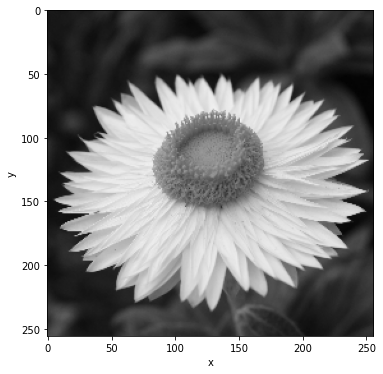

In [12]:
plt.figure(figsize=(6, 6))

# for plt.imshow remember to set vmin=0, vmax=255 so it doesn't try to normalize the image
plt.imshow(flower1, cmap="gray", vmin=0, vmax=255) # display image data. cmap = colour map
plt.ylabel("y")
plt.xlabel("x")
plt.show()

Using matplotlib's imshow function we are able to see that it is an image of a flower, but what about the underlying signal, what does it look like?

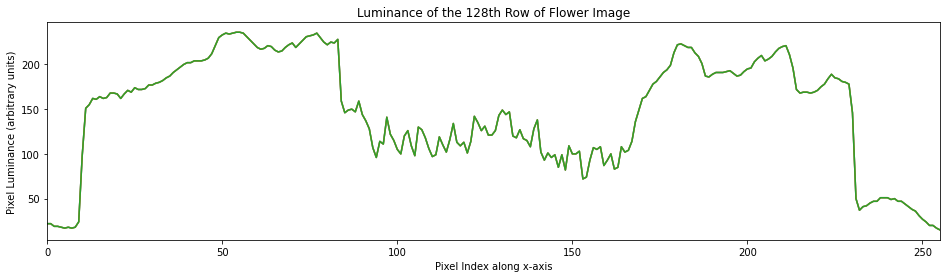

In [13]:
row = 128
plt.figure(figsize=(16,4))
plt.plot(flower1[row]) # index into 2D array, return specified row
plt.xlabel("Pixel Index along x-axis")
plt.ylabel("Pixel Luminance (arbitrary units)")
plt.title("Luminance of the {0}th Row of Flower Image".format(row))
plt.xlim([0, 255])
plt.show()

If we take a look at the 128th row of the image, or equivalently the 128th chunk of the signal, we can see two peaks in luminance (brightness) centered around x=50 and x=200, as well as a trough at x=125. Looking back at the image we see that if we took such a slice through the middle of the image, we'd see two patches of bright petals and a patch of dark pistil (center of the flower) matching these peaks and trough. Feel free to change the row variable and explore the shapes of signal chunks produced by other slices of the flower.

### Root Mean Square Error (RMSE)

So now we can load and understand images visually, but what we really need right now is a good way to compare them numerically. We'll use the RMSE, or [Root Mean Square Error](https://en.wikipedia.org/wiki/Root-mean-square_deviation), a popular image processing similarity/error metric:


$$ RMSE = \sqrt{\frac{1}{N}\sum_{n=0}^{N-1}(x_{1}[n]-x_{2}[n])^{2}}=\sqrt{\frac{1}{W\cdot H}\sum_{x=0}^{W-1}\sum_{y=0}^{H-1}(I_{1}[y,x]-I_{2}[y,x])^{2}} $$

Where $x_1, x_2$ are the image signals and $N$ is their size, or alternatively $I_1,I_2$ are image matrices with heights $H$ and widths $W$. This error formula penalizes large differences in luminance very heavily. To relate this back to what you've already seen, this is the 2D version of taking the energy of the (now 2D) error signal $x_1[n] - x_2[n]$, but then taking the square root of that energy and normalizing it by multiplication with $1 / \sqrt{N}$.

Implement the RMSE function below. The function [np.flatten()](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.ndarray.flatten.html) could be useful here.

In [14]:
def RMSE(im1, im2):
    """
    Returns the Root Mean Square Error between two images.
    Parameters:
    im1     - Image 1, 2D numpy array
    im2     - Image 2, 2D numpy array
    err     - Calculated error
    """
    assert im1.shape == im2.shape, "shape mismatch"
    err = 0
    ## TODO ##
    w = im1.shape[0]
    h = im1.shape[1]
    err = np.sqrt(1 / (w * h) * np.sum((im1.flatten() - im2.flatten())**2))

    ## TODO ##
    return err

Now:  
1. Load lizard.tiff  
2. Print out the RMSE between flower1 and the lizard  
3. Print out the RMSE between flower1 and itself  

As a sanity check on your answers, consider the following questions (you don't need to answer them here, but they're worth considering): What do we expect to have the higher RMSE? What do we expect to be the RMSE between an image and itself?

In [15]:
## TODO ##
lizard = cv.imread("images/lizard.tiff") 
print(f"RMSE of flower1 and lizard: {RMSE(flower1, lizard)}")
print(f"RMSE of flower1 and itself: {RMSE(flower1, flower1)}")

## TODO ##

RMSE of flower1 and lizard: 17.903386551152828
RMSE of flower1 and itself: 0.0


Now we can understand and compare images; there's just one tricky bit left. What do we *do* with the images?

## Q2b: 2D Convolution? 1D Was Hard Enough Already!
By now 1D convolution should make some semblance of sense: take a filter and slide it over the signal. In 2D we can try to do the same thing, slide a 1D filter over the entire image signal row by row; but this would lead to us being only being able to filter features along the x axis, and would carry over information from one edge of the image to the other. We thus instead opt to use a 2D convolutional filter, called a "kernel", for our 2D image.  

The process of 2D convolution looks fairly familiar: you first flip the kernel along the x and y axes, and then slide it along the image matrix. The kernel will always be of an odd dimension, typically 3x3 or 5x5, and thus have exactly one center point. This center point is aligned to a pixel in your image matrix, and the output pixel is the dot product of the kernel at that position and that portion of the image matrix.  

If the kernel "goes over the edge" of the image matrix we can deal with it just as in the 1D case, by either pretending the image matrix is padded by zeroes (what we will typically do), or wrap the kernel around to the other side of the matrix (helps to combat edge artifacts). The second full method is demonstrated in the helpful .gif below (run the cell to see it):

In [16]:
from IPython.display import HTML
HTML('<img src="https://upload.wikimedia.org/wikipedia/commons/4/4f/3D_Convolution_Animation.gif">')

### Image Interpretation of Frequencies

2D kernel convolution has entire chapters of textbooks dedicated to its intricacies (A good reference text is Digital Image Processing by Gonzalez and Woods), and so the main take-away for now is that it's just sliding and dot products as in the 1D case, but now the sliding is done in two directions.  

Kernels are filters just like any other, existing as low-pass, high-pass, band-pass and band-stop just like in 1D. But what exactly does a low pass filter mean for an image? For music a low-pass filter will leave you with just the sound of the bass, but for images it'll just leave you with a blurrier image, due to the following:

<p align="center">
  <img src="figs/frequency.png" alt="drawing" width="800px"/>  
</p>
<br>

For images, since your signal elements are luminance, high frequencies correspond to rapid changes in this luminance, like what you'd find in a checkerboard pattern. On the opposite end of the spectrum (pun intended), lower frequencies represent smoother visual transitions like the slow gradient of a sunset.

### Gaussian Blur

Let's try out what we've learned so far by convolving an image matrix with a gaussian kernel, which will take a weighted average of patches of the image, hopefully acting like a low-pass filter. The gaussian kernel is given by:

$$gkern(x,y) = \dfrac{1}{2\pi\sigma^{2}}exp\left\{ \dfrac{-(x^{2}+y^{2})}{2\sigma^{2}}\right\} $$

The effect of convolving an image with this filter is often referred to as "Gaussian blur", due to the fact that 2D low-pass filtering is just blurring, as discussed above. If you go into image editing software such as Adobe Photoshop, you'll find commands that allow you to apply this same Gaussian blur to images - this filtering operation is what Photoshop is doing behind the scenes!

In [17]:
def gkern(size=5, sigma=1.0):
    """
    Returns a gaussian kernel with zero mean.
    
    Adapted from:
    https://stackoverflow.com/questions/29731726/how-to-calculate-a-gaussian-kernel-matrix-efficiently-in-numpy
    
    Parameters:
    size    - Sidelength of gaussian kernel
    sigma   - Value of standard deviation
    """
    ax = np.arange(-size // 2 + 1.0, size // 2 + 1.0)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2.0 * sigma**2))
    return kernel / np.sum(kernel)

Code for producing the kernel is given above; it's up to you to use the [scipy.signal.convolve2d()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html) function to apply the filter to the **lizard.tiff** image. **IMPORTANT: Use `mode="same"` and keep `boundary` as the default value (padding the image matrix with zeroes before convolution).**

We'll experiment with different values of "sigma" and "size" and be prepared to report on their effects. Your task is to use plt.imshow() to display 4 images: the original lizard, plus three **labelled** blurrings of it. So in total, you must create and plot:
1. The original lizard image.
2. A version blurred with **high sigma and small kernel size**.
3. A version blurred with **low sigma and large kernel size**.
4. A version blurred with **high sigma and large kernel size**.

Definitions of "high/low sigma" and "high/low kernel size" have been given for you in the cell.

How you actually display the images (e.g., in a 2x2 grid using `plt.subplot`, or just by making 4 separate figures) is up to you; we don't care for grading purposes. **Don't forget to set `cmap="gray"` in your calls to `plt.imshow`** !

(256, 256)


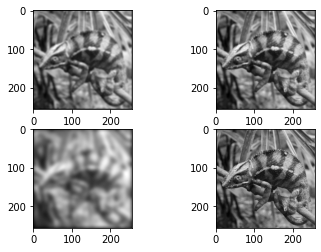

In [18]:
high_sigma = 5
low_sigma = 1
big_kernel = 50
small_kernel = 5

## TODO ##
lizard_m = np.mean(lizard,axis=-1)
print(lizard_m.shape)
gkern1 = gkern(small_kernel, high_sigma)
gkern2 = gkern(big_kernel, low_sigma)
gkern3 = gkern(big_kernel, high_sigma)

liz1 = signal.convolve2d(lizard_m, gkern1, "same")
liz2 = signal.convolve2d(lizard_m, gkern2, "same")
liz3 = signal.convolve2d(lizard_m, gkern3, "same")
plt.subplot(2,2,1)
plt.imshow(liz1, cmap="gray")
plt.subplot(2,2,2)
plt.imshow(liz2, cmap="gray")
plt.subplot(2,2,3)
plt.imshow(liz3, cmap="gray")
plt.subplot(2,2,4)
plt.imshow(lizard_m, cmap="gray")
plt.show()
## TODO ##

**Q: What visual effect does increasing sigma have for blurring? What happens to the gaussian kernel (what other filter does it approach)?** 

<span style="color:blue">A: (TODO)</span> more sigma more blurring.

**Q: What visual effect does increasing kernel size have for blurring? What happens to the edges of the image (do they get brighter/darker?), why?**

<span style="color:blue">A: (TODO)</span> bigger size more blurring. darker.

**Q: What are the first visual features of the lizard to be blurred away? What are the last? What does this say about the frequencies of those features?**

<span style="color:blue">A: (TODO) </span> edge. color.

### Image Sharpening

Another feature of most image processing software is the "sharpening" function, here we'll demonstrate how we can sharpen a picture by blurring it! Well, what we really want to do is blur an image, and then subtract that blur from the original image; in a way 'soft cropping' the image's Fourier domain by reducing the amount of low-frequency components in it.

Try sharpening **flower2.tiff**, experiment with different values of sigma, kernel size, and alpha/beta (to perform a weighted subtraction of the image and it's blur) and use plt.imshow() to display the original picture and its sharpening:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


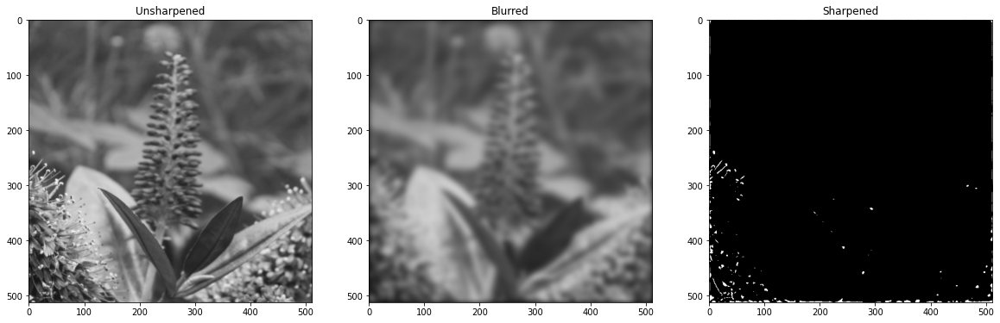

In [19]:
## TODO ##
flower2 = cv.imread("images/flower2.tiff")
alpha = 1.1          # modify
beta =  1.8          # modify
gaussian_kernel = gkern3  # modify
flower2_blurred = np.zeros_like(flower2)
for i in range(3):
    flower2_blurred[:,:,i] = signal.convolve2d(flower2[:,:,i], gkern3, "same") # modify
flower2_sharpened = alpha*flower2 - beta*flower2_blurred
## TODO ##


# Plot
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.imshow(flower2, cmap="gray", vmin=0, vmax=255)
plt.title("Unsharpened")

plt.subplot(1, 3, 2)
plt.imshow(flower2_blurred, cmap="gray", vmin=0, vmax=255)
plt.title("Blurred")

plt.subplot(1, 3, 3)
plt.imshow(flower2_sharpened, cmap="gray", vmin=0, vmax=255)
plt.title("Sharpened")

plt.show()

You should definitely be able to see some sharpening, especially around the edges of the leaves, but the final result won't  be amazing. In Question 2c, we'll try to find a smarter way of approaching this general problem of image denoising.

### 2D DFT

Finally, before discussing 2D deconvolution, let's reintroduce one last method from our 1D signal analysis toolbox: the discrete fourier transform. the 2D DFT is a fairly advanced topic which is explored in more detail in future classes such as EECS 225B, but for now let's just figure out how to read the magnitude plot of the 2D DFT. Just like we typically do for the 1D DFT, we will use `np.fft.fftshift` to center the lowest frequency (DC) in the middle of the plot. The 2D DFT formula looks exactly like the 1D formula, but summed over two axes:

$$ X[\omega_x,\omega_y]=\frac{1}{M\cdot N}\sum_{x=0}^{M-1}\sum_{y=0}^{N-1}I[y,x]e^{-2\pi\left(\dfrac{k}{M}x+\dfrac{l}{N}y\right)} $$

In the 2D DFT we thus have two directions in which we care about frequencies appearing in, x and y; and so we instead of choosing an N point DFT we now choose to sample a (M,N) point 2D DFT. In return we get a 2 dimensional magnitude plot which will show us the distribution of frequencies along both axes, as displayed below (after being fft shifted):

<img src="figs/2d_dft.png" alt="drawing" width="800px"/>

As we can see, low frequencies are now in the center of the 2D plot, and high frequencies tend towards the corners.

Now a demonstration of calculating and plotting the 2D DFT of a test image:

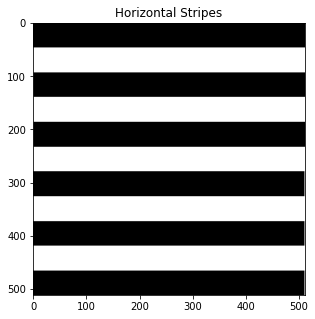

In [20]:
test_stripes = cv.imread("images/test_stripes.tiff")
plt.figure(figsize=(5, 5))
plt.imshow(test_stripes, cmap="gray")
plt.title("Horizontal Stripes")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


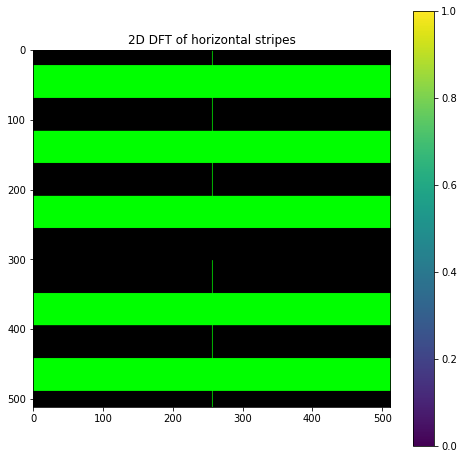

In [21]:
plt.figure(figsize=(8, 8))
test_fft = np.fft.fft2(test_stripes) # take 2D DFT with default parameters
test_fft = np.fft.fftshift(test_fft) # shift low frequencies to center of plot
test_fft = abs(test_fft) # calculate magnitude of DFT
plt.imshow(test_fft)
plt.colorbar()
plt.title("2D DFT of horizontal stripes")
plt.show()

This plot is a bit hard to read so we'll add in an extra step and plot the log of the absolute value of the DFT, essentially giving us a magnitude plot in decibels (up to a scaling factor), like what you saw in the circuits portion of EE 16B.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


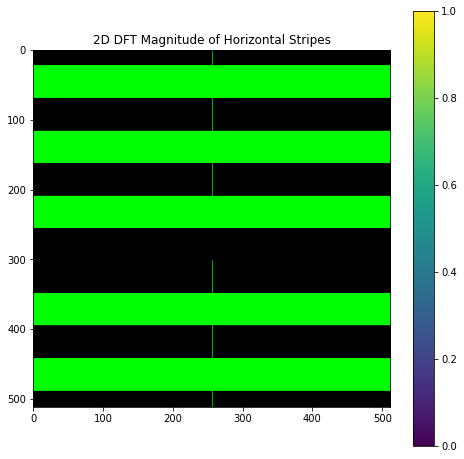

In [22]:
plt.figure(figsize=(8, 8))
test_fft = np.fft.fft2(test_stripes) # take 2D DFT with default parameters
test_fft = np.fft.fftshift(test_fft) # shift low frequencies to center of plot
test_fft = abs(test_fft) # calculate magnitude of DFT
test_fft = np.log(test_fft + 1e-9) # take log of magnitude for plotting (add 1e-9 to avoid taking log of zero)
plt.imshow(test_fft)
plt.colorbar()
plt.title("2D DFT Magnitude of Horizontal Stripes")
plt.show()

Looking at this magnitude plot for the 2D DFT of horizontal stripes, we see a high amount of its energy is concentrated around the line of x = 256, the center x axis of the plot, meaning it's mostly low frequencies in the x direction. Going along the the x axis we see each column of the 2D DFT is identical (save for at DC) meaning nothing interestng is happening in the image along the horizontal, which makes sense as every column of the image looks identical.

Now let's take a vertical slice of the image and the 2D DFT:

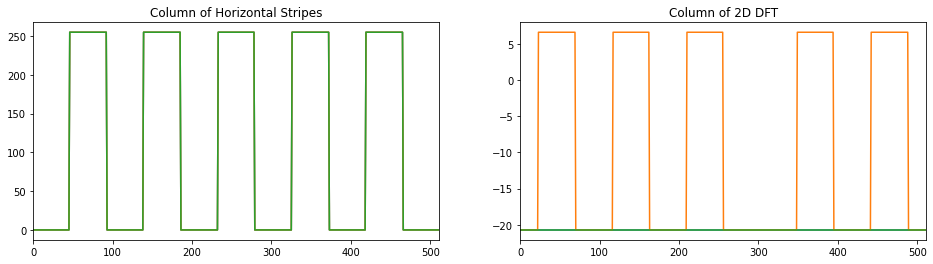

In [23]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.plot(test_stripes[:,10])
plt.xlim([0, 511])
plt.title("Column of Horizontal Stripes")

plt.subplot(1, 2, 2)
plt.plot(test_fft[:,10])
plt.xlim([0, 511])
plt.title("Column of 2D DFT")
plt.show()

The vertical slice of the image looks like a series of rectangles, which we know correspond to the superposition of a bunch of sinc shapes in the fourier domain; exactly what the vertical slice of the 2D DFT appears to be. This is not a coincidence, and exploration of this relationship led to the discovery of the [Radon transform](https://en.wikipedia.org/wiki/Radon_transform), which in turn led to the development of medical technologies such as [Computed Tomography Scanning](https://en.wikipedia.org/wiki/CT_scan). 

Now it's your turn: Plot the (logarithm of the) 2D DFT magnitude of the lizard image from before and the 2D DFT magnitude of its blurriest variant (the high sigma and high kernel size one), and see if you can spot what happened to the distribution of frequencies in the image.

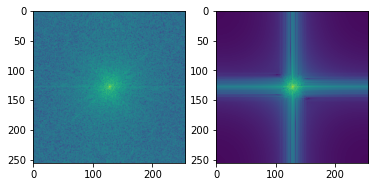

In [26]:
## TODO ##
LIZ = np.fft.fftshift(np.fft.fft2(lizard_m))
LIZ3 = np.fft.fftshift(np.fft.fft2(liz3))
log_LIZ = 20*np.log10(np.abs(LIZ))
log_LIZ3 = 20*np.log10(np.abs(LIZ3))
plt.subplot(121)
plt.imshow(log_LIZ)
plt.subplot(122)
plt.imshow(log_LIZ3)
plt.show()
## TODO ##

**Q: Where in the 2D DFT magnitude plot is most of the energy concentrated for the blurred image? What frequencies (and in what directions) does this correspond to?**

<span style="color:blue">A: (TODO) </span> Center. Low frequency.

# Q2c: Image Deconvolution, The 1.5 Billion Dollar Problem

Now that we've gained some intuition about image matrix manipulation, convolution, and the 2D DFT, we can tackle a real-life problem which plagued scientists working on the Hubble Telescope in the 90's. The problem was that light, like most things in the universe, likes to spread out over distance. If you've ever pointed a flashlight into the night sky:  

<br>
<center> <img src="figs/light.jpg" alt="drawing" width="400px"/></center>
<br>

You've probably noticed that light spreads out in a cone shape rather than stay a cylindrical beam. In fact, this is true of any light source; even lasers exhibit this spread pattern. Just as with (what feels like) almost everything in the academic world, this light spread is very reasonably modelled via a Gaussian distribution; the tricky bit comes down to figuring out what exact parameters to use. 

## The Hubble Space Telescope Disaster

When scientists first recieved images from the Hubble Space Telescope, they were devastated to find them all catastrophically blurred! As it turned out, the main mirror of the telescope had been polished into the [wrong shape](https://en.wikipedia.org/wiki/Hubble_Space_Telescope#Flawed_mirror), meaning the light hitting the sensor was out of focus, and exhibited this same Gaussian spread as we discussed in the flashlight example.  

The engineers on the Hubble team were not about to let a 1.5 billion dollar project go to waste for one faulty mirror, and so they turned to math for the answer, holding a workshop with the world's leading experts on image and signal processing present to try and tackle the problem. They ended up producing a 150 page manuscript of [solutions](http://www.stsci.edu/hst/HST_overview/documents/RestorationofHSTImagesandSpectra.pdf) to the issue. Here we'll go through one of the most succesful ones, and the one that the Hubble team actually ended up using to fix the problem: **image deconvolution**. 

## 2D Fourier Deconvolution

Just like the 1D example at the start of this lab, if we assume that our blur is modelled by a convolution of the original sharp image with a gaussian kernel then for the 2D case:  


$ y(x,y) = (x * h)(x,y) \Longleftrightarrow Y(\omega_x,\omega_y) = X(\omega_x,\omega_y)\cdot H(\omega_x,\omega_y) $

$Y(\omega_x,\omega_y) = X(\omega_x,\omega_y)\cdot H(\omega_x,\omega_y) \implies X(\omega_x,\omega_y) = \frac{Y(\omega_x,\omega_y)}{H(\omega_x,\omega_y)}$


Where $x$ is the original image, $h$ is the gaussian kernel, and $y$ is the resultant blurred image. First let's start by modifiying the deconvolve function from earlier for 2D: Implement `deconvolve2d` below; this time you don't need to worry about any sort of `fftshift`s. The functions `np.fft.fft2` and `np.fft.ifft2` for handling 2D DFTs and inverse DFTs will be of use. Don't forget to handle numerical noise with `np.real` as before!   
  
  
**Note:** just like in 1D decovolution, make sure that the two FFT's are the same size when dividing them; you can use the size of the space images to choose an fft size.

In [27]:
def deconvolve2d(y, h):
    """
    Perform a Fourier deconvolution to deconvolve h "out of" y, assuming
    that h, y and the deconvolved signal are both purely real images.
    
    Parameters:
    y        - Image for deconvolution
    h        - Convolution kernel 
    """
    ## TODO ##
    w1 = y.shape[0]
    w2 = y.shape[1]
    H = np.fft.fft2(h, (w1,w2))
    Y = np.fft.fft2(y)
    x = np.real(np.fft.ifft2(Y/H))
    return x
    
    ## TODO ##

## Peter, NASA Engineer

The year is 1991. You're an image processing engineer at NASA, and your team has been working tirelessly to correct the issues with the Hubble Space Telescope. A mission to install corrective optics is being planned but won't happen for another two years; in the meantime, you (and your government funding sources) don't want all of the pictures taken to go to waste. Fortunately, your colleagues have made a reconstruction of **space1_blurred.npy**, manually creating a sharp **space1.tiff** (this is what scientists actually did in the Hubble faulty mirror problem) to use as a model dataset. Running the cell below will display the telescope's original captured image and the manually sharpened one.

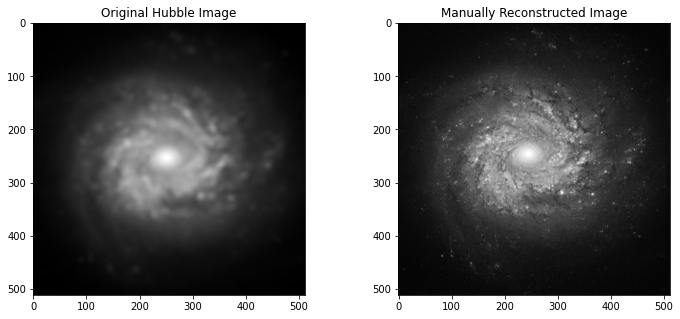

In [28]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(np.load("space1_blurred.npy"), cmap="gray")
plt.title("Original Hubble Image")

plt.subplot(1, 2, 2)
plt.imshow(cv.imread("images/space1.tiff"), cmap="gray")
plt.title("Manually Reconstructed Image")
plt.show()

The scientists you work with were happy to provide you with this test data, but what they really want is an automated way to perform this type of enhancement using computer software so they don't have to work so tirelessly for every single image that the telescope takes. You've chosen to model the mirror's defects as a Gaussian blur effect, but you don't know what the parameters (the kernel size, and sigma) are. You know that this is an LTI operation, and recalling your EE 120 knowledge, you know this means that you can undo it via deconvolution! 

There's just one catch - you have to find what parameters for the gaussian kernel lead to the lowest error between the deconvolved image you produce and the manual reconstruction of it your scientists gave you, stored in `space1.tiff`.

## Quick and Dirty Numerical Optimization: The Parametric Sweep

Since deconvolution is an analytically difficult problem to optimize, you decide to do something very common in engineering: a parametric sweep. In a parametric sweep, we iterate over all possible combinations of the parameters we want to tune (here, just kernel size and sigma) and see which one is "best". Since we want to limit computation we pick a discrete set of each paramater to iterate over. Essentially, it's a poor man's convex optimization method. When the number of possible combinations (in optimization, this is called the "search space") isn't ridiculously large, this method is computationally tractable.

Equipped with this new knowledge, you decide to use the parametric sweep to numerically optimize your deconvolution kernel's parameters so you get the best possible results based on your parameters. But we still need some numerical measure of what the "best" deconvolution means, this is where our RMSE function comes in from earlier! We can use it to assign scores to the different deconvolved images,

To implement the parameteric sweep: 
1. Iterate through all combinations of $(\text{Kernel Size}, \sigma)$ for $\text{Kernel Size} \in \{1, 3, 5, 7, ..., 19, 21, 23, 25\}$ (remember, kernel size must be odd) and $\sigma \in [0, 10]$. Since you can't actually test every single real number in the interval of 0 to 10 for $\sigma$, just pick 50 values from that interval that are spaced out evenly. The function `np.linspace` will be useful.
2. Using each pair $(\text{Kernel Size}, \sigma)$, apply the 2D Fourier deconvolution algorithm you implemented with `deconvolve2d` using a Gaussian kernel (`gkern`) on the blurred image.
3. Compute the RMSE of the deconvolved result against the manually cleaned up image, and save the RMSE, sigma, and Kernel Size that give the best result, in terms of minimizing RMSE.
4. Store the end result of your parameteric sweep as the Gaussian kernel that gave the best result, `best_kernel`. There's code given that will display the end results (in terms of both RMSE and the actual image) for you.

Hint: The standard way to track the "best result" for these types of situations is to declare some variable, say, `best_RMSE` before you iterate, and set it to some ridiculously high value (you can use `np.inf`, numpy's value representing infinity, if you'd like, but anything above 1000 is more than big enough). Here, you'll also need a `best_sigma` and `best_kernel_size`. Each time you get a better (lower) RMSE, update these variables. While it's not required, printing out each of them every time they're updated would be very instructive in seeing how this optimization technique converges to the optimal pair $(\text{Kernel Size}, \sigma)$.

Let's go! **Ignore any division by zero warnings; this is from our deconvolution function because we're dividing by very small values.**

In [36]:
# Load images
space1_blurred = np.load("space1_blurred.npy") # blurred image
space1_ideal   = cv.imread("images/space1.tiff").mean(axis=-1)     # manually reconstructed image

## TODO ##


ker_size_group = np.arange(1,26,2)
sigma_group = np.linspace(0,10,50)

best_kernel_size = ker_size_group[0]
best_sigma = sigma_group[0]
best_RMSE = np.inf

for ker_size in ker_size_group:
    for sigma in sigma_group:
        the_gk = gkern(ker_size, sigma)
        img_recon = deconvolve2d(space1_blurred, the_gk)
        the_RMSE = RMSE(img_recon, space1_ideal)
        if the_RMSE < best_RMSE:
            best_RMSE = the_RMSE
            best_kernel_size = ker_size
            best_sigma = sigma
            best_kernel = the_gk
## TODO ##

C:\Users\Peter\AppData\Local\Temp\ipykernel_25084\4073702563.py:14: RuntimeWarning: invalid value encountered in true_divide
  kernel = np.exp(-(xx**2 + yy**2) / (2.0 * sigma**2))
C:\Users\Peter\AppData\Local\Temp\ipykernel_25084\2065456016.py:15: RuntimeWarning: invalid value encountered in true_divide
  x = np.real(np.fft.ifft2(Y/H))
C:\Users\Peter\AppData\Local\Temp\ipykernel_25084\4073702563.py:14: RuntimeWarning: divide by zero encountered in true_divide
  kernel = np.exp(-(xx**2 + yy**2) / (2.0 * sigma**2))


Original RMSE: 12.303
Best RMSE:     1.962
Numerically optimized Fourier deconvolution is 6.271 better in terms of RMSE.


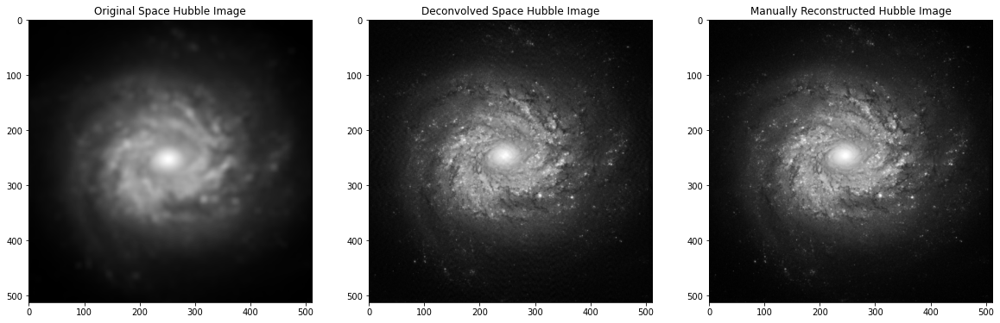

In [37]:
# Display results  
meas_RMSE = RMSE(space1_blurred, space1_ideal)
print("Original RMSE: " + str(round(meas_RMSE, 3)))
print("Best RMSE:     " + str(round(best_RMSE, 3)))
ratio = meas_RMSE / best_RMSE
print("Numerically optimized Fourier deconvolution is {0} better in terms of RMSE.".format(round(ratio, 3)))

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(space1_blurred, cmap="gray")
plt.title("Original Space Hubble Image")

plt.subplot(1, 3, 2)
plt.imshow(deconvolve2d(space1_blurred, best_kernel), cmap="gray")
plt.title("Deconvolved Space Hubble Image")

plt.subplot(1, 3, 3)
plt.imshow(space1_ideal, cmap="gray")
plt.title("Manually Reconstructed Hubble Image")
plt.show()

Results looking good? Nice!

Now, since we said that the corruption with our space telescope is consistently a Gaussian blur, and consistently the same kernel (since it's ultimately the telescope itself rather than some other random phenomenon), applying this same deconvolution method with the same kernel to any image it captures should give us the same kind of improvement! 

Let's use our calculated best gaussian kernel, `best_kernel`, to attempt to deconvolve another image of space that was captured, **space2_blurred.npy**, without having to manually reconstruct it.

To complete the lab, run the cell below (no code on your part required), which will apply the same deconvolution technique to this newly acquired image and display the result. After running it, you're all done.

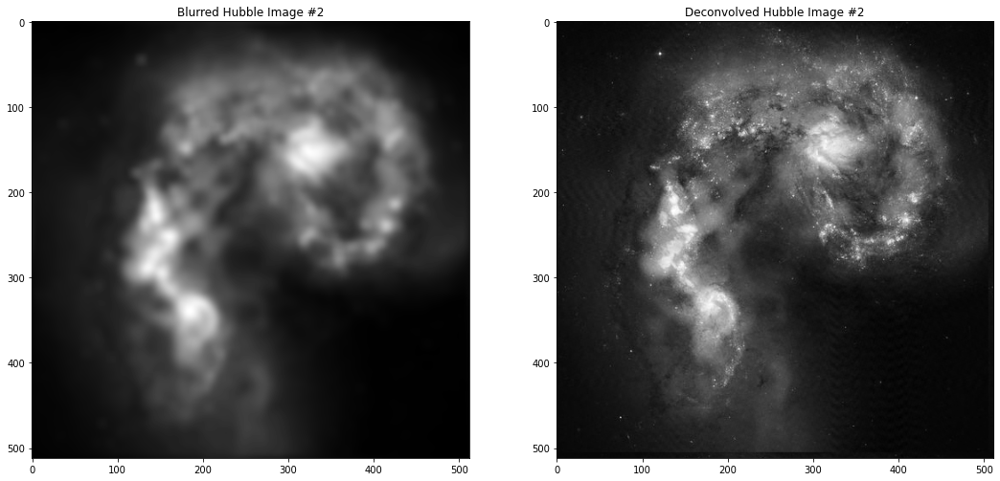

In [38]:
space2_blurred = np.load("space2_blurred.npy")
plt.figure(figsize=(18, 10))
plt.subplot(1, 2, 1)
plt.imshow(space2_blurred, cmap="gray")
plt.title("Blurred Hubble Image #2")

plt.subplot(1, 2, 2)
plt.imshow(deconvolve2d(space2_blurred, best_kernel), cmap="gray")
plt.title("Deconvolved Hubble Image #2")
plt.show()

**A parting note on the instability of 2D deconvolution:** 2D deconvolution is such an [ill-conditioned](https://en.wikipedia.org/wiki/Condition_number) problem that we had to give you numpy arrays for the blurred space images. This is because if we rounded the floating point data to its nearest integer representation, and saved it as a .tiff image file, that change would alone be enough that our deconvolution algorithm would never converge on optimal solution (the error would always be massive, even for the "correct" gaussian kernel parameters).

# References

[1] *Signal reflection (Wikipedia)*. [Link](https://en.wikipedia.org/wiki/Signal_reflection)  
[2] *AT&T Archives: Similarities of Wave Behavior*. [Link](https://www.youtube.com/watch?v=DovunOxlY1k)  
[3] *Audio feedback (Wikipedia)*. [Link](https://en.wikipedia.org/wiki/Audio_feedback)  
[4] *Dereverberation (Wikipedia)*. [Link](https://en.wikipedia.org/wiki/Dereverberation)  
[5] *Stereophonic Acoustic Echo Cancellation: Theory and Implementation*. [Link](http://lup.lub.lu.se/search/ws/files/4596819/1001945.pdf)  
[6] *Restoration of Hubble Space Telescope Images and Spectra*. [Link](http://www.stsci.edu/hst/HST_overview/documents/RestorationofHSTImagesandSpectra.pdf)  
[7] *Richardson-Lucy deconvolution (Wikipedia)*. [Link](https://en.wikipedia.org/wiki/Richardson%E2%80%93Lucy_deconvolution)  
[8] *Wiener deconvolution (Wikipedia)*. [Link](https://en.wikipedia.org/wiki/Wiener_deconvolution)  
[9] *Signals, Systems, and Inference, Chapter 11: Wiener Filtering*. [Link](https://ocw.mit.edu/courses/electrical-engineering-and-computer-science/6-011-introduction-to-communication-control-and-signal-processing-spring-2010/readings/MIT6_011S10_chap11.pdf)  
[10] 2D convolution GIF. [Link](https://upload.wikimedia.org/wikipedia/commons/4/4f/3D_Convolution_Animation.gif)  
[11] *LTI Models and Convolution, Section 11.2.3: Deconvolution*. [Link](https://ocw.mit.edu/courses/electrical-engineering-and-computer-science/6-02-introduction-to-eecs-ii-digital-communication-systems-fall-2012/readings/MIT6_02F12_chap11.pdf)  
[12] *The Scientist and Engineer's Guide to Digital Signal Processing: Chapter 17, Custom Filters and Deconvolution*. [Link](https://www.dspguide.com/ch17/2.htm)